### Scripts

In [1]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
! mkdir ~/.kaggle

In [3]:
! cp kaggle.json ~/.kaggle

In [4]:
! chmod 600 ~/.kaggle/kaggle.json

In [5]:
! kaggle datasets download -d shravankumar9892/image-colorization

100% 2.10G/2.10G [01:00<00:00, 33.7MB/s]
100% 2.10G/2.10G [01:00<00:00, 37.3MB/s]


In [6]:
! unzip image-colorization.zip

Archive:  image-colorization.zip
  inflating: ab/ab/ab1.npy           
  inflating: ab/ab/ab2.npy           
  inflating: ab/ab/ab3.npy           
  inflating: inception_resnet_v2_weights_tf_dim_ordering_tf_kernels.h5  
  inflating: l/gray_scale.npy        


### Imports

In [7]:
import numpy as np
from skimage.color import lab2rgb
import matplotlib.pyplot as plt
import cv2
import gc
import torch
import torch.nn as nn
import pandas as pd
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

Device

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

###Parameters

In [9]:
GEN_IMAGE_DIMS = (224, 224, 1)
GEN_INPUT_SIZE= GEN_IMAGE_DIMS[0] * GEN_IMAGE_DIMS[1] * GEN_IMAGE_DIMS[2]
GEN_LATENT_SIZE = 64
GEN_OUTPUT_SIZE = GEN_INPUT_SIZE * 2
DISCRIM_IMAGE_DIMS = (224, 224, 2)
DISCRIM_INPUT_SIZE= DISCRIM_IMAGE_DIMS[0] * DISCRIM_IMAGE_DIMS[1] * DISCRIM_IMAGE_DIMS[2]
DISCRIM_HIDDEN_SIZE = 64

GRAY_CHANNELS = 1
COLOR_CHANNELS = 2
LEARNING_RATE = 0.0002
NUM_HIDDEN_LAYERS = 2
EPOCHS = 20
BATCH_SIZE = 64

### Data Pre-Processing

In [10]:
ab1 = np.load('/content/ab/ab/ab1.npy')
ab2 = np.load('/content/ab/ab/ab2.npy')
ab3 = np.load('/content/ab/ab/ab3.npy')
gray_data = np.load('/content/l/gray_scale.npy')
ab_data = np.concatenate([ab1, ab2, ab3], axis=0)
gray = gray_data[:5000]
ab = ab_data[:5000]

In [11]:
del ab1
del ab2
del ab3
del gray_data
del ab_data
gc.collect()

33

In [12]:
print(np.amax(ab))

226


In [ ]:
# plt.figure(figsize=(30,30))
# for i in range(1,5):
#     plt.subplot(4,4,i)
#     img = np.zeros((224,224,3))
#     img[:,:,0] = gray[i][:, :, 0]
#     plt.title('Grayscale')
#     plt.imshow(img[:,:,0])

#     plt.subplot(4,4,i+4)
#     img = np.zeros((224,224,3))
#     img[:,:,0] = gray[i][:, :, 0]
#     img[:,:,1:] = ab[i]
#     img = img.astype('uint8')
#     img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
#     plt.title('Color')
#     plt.imshow(img)

In [13]:
class ImageDataset(Dataset):
    def __init__(self, gray, ab):
      #color = np.concatenate((gray, ab), axis=3)

      self.color = ab
      self.gray = gray

    def __len__(self):
        return len(self.gray)

    def __getitem__(self, idx):
        return self.gray[idx], self.color[idx]

In [14]:
gray = gray[:, :, :, np.newaxis]
gray = gray / 255
ab = ab / 255

# print(gray_new[0])
print(gray.shape)
print(ab.shape)

(5000, 224, 224, 1)
(5000, 224, 224, 2)


In [15]:
# Data Loader

image_dataset = ImageDataset(gray, ab)
image_dataloader = DataLoader(image_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [16]:
del gray
del ab
gc.collect()

0

### GAN

In [29]:
class MLPGenerator(torch.nn.Module):
    
    def __init__(self, 
                 input_size, 
                 latent_size, 
                 output_size, 
                 activation: torch.nn.Module):
        """Construct a simple MLP generator"""
        
        # https://colab.research.google.com/drive/1LlrBNa9txURGZHEVQPfq2niqeMVZILz-?usp=sharing#scrollTo=K0Npg1fO_jxx

        super().__init__()

        self.embedding = nn.Embedding(input_size, 5)

        self.down_0 = nn.Sequential(
            # BATCH_SIZE x 1 x 224 x 224
            nn.Conv2d(GRAY_CHANNELS, latent_size, 
                               kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
        )

        self.down_1 = nn.Sequential(     
            # BATCH_SIZE x 64 x 112 x 112     
            nn.Conv2d(latent_size, latent_size*2, 
                               kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(latent_size*2),
            nn.LeakyReLU(0.2),
        )

        self.down_2 = nn.Sequential(
            # BATCH_SIZE x 128 x 56 x 56 
            nn.Conv2d(latent_size*2, latent_size*4, 
                               kernel_size=4, stride=2,  padding=1),
            nn.BatchNorm2d(latent_size*4),
            nn.LeakyReLU(0.2)
        )

        self.down_3 = nn.Sequential(
            # BATCH_SIZE x 256 x 28 x 28
            nn.Conv2d(latent_size*4, latent_size*8, 
                               kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2)
        )

        self.up_0 = nn.Sequential( 
            # BATCH_SIZE x 512 x 14 x 14
            nn.ConvTranspose2d(latent_size*8, latent_size*4, 
                      kernel_size=4, stride=2, padding=1),
            # BATCH_SIZE x 256 x 28 x 28
            nn.ReLU(),
            nn.Dropout(0.5)
        )

        self.up_1 = nn.Sequential(
            # BATCH_SIZE x 512 x 28 x 28 - Concat up_0 + down_2
            nn.ConvTranspose2d(latent_size*8, latent_size*2, 
                      kernel_size=4, stride=2, padding=1),
            # BATCH_SIZE x 128 x 56 x 56
            nn.BatchNorm2d(latent_size*2),
            nn.ReLU()
        )

        self.up_2 = nn.Sequential(
            # BATCH_SIZE x 256 x 56 x 56 - Concat up_1 + down_1
            nn.ConvTranspose2d(latent_size*4, latent_size, 
                      kernel_size=4, stride=2, padding=1),
            # BATCH_SIZE x 64 x 112 x 112
            nn.BatchNorm2d(latent_size),
            nn.ReLU()
        )

        self.up_3 = nn.Sequential(
            # BATCH_SIZE x 128 x 112 x 112 - Concat up_2 + down_0
            nn.ConvTranspose2d(latent_size*2, latent_size, 
                      kernel_size=4, stride=2, padding=1),
            # BATCH_SIZE x 64 x 224 x 224
            nn.BatchNorm2d(latent_size),
            nn.ReLU()
        )

        self.out = nn.Sequential(
             # BATCH_SIZE x 64 x 224 x 224
            nn.ConvTranspose2d(latent_size, COLOR_CHANNELS, 
                      kernel_size=1, stride=1, padding=0),
            # BATCH_SIZE x 2 x 224 x 224
            nn.BatchNorm2d(COLOR_CHANNELS),
            nn.Sigmoid()
        )

        self.encoders = [
            self.down_0,
            self.down_1,
            self.down_2,
            self.down_3
        ]

        self.decoders = [
            self.up_0,
            self.up_1,
            self.up_2
        ]
    
    def forward(self, z: torch.Tensor, x: torch.Tensor):
        # z not used!
        skip_connections = []

        for enc in self.encoders:
          x = enc(x)
          skip_connections.append(x)

        skip_connections = list(reversed(skip_connections[:-1])) # keep all but first encoder

        # skip connections
        for dec, skip in zip(self.decoders, skip_connections):  # (down_2, up_0), (d_1, u_1), (d_0, u_2)
          x = dec(x)
          x = torch.cat([x, skip], axis=1)

        x = self.up_3(x)
        x = self.out(x)
        return x

        # x = self.down_0(gray)    
        # x = self.down_1(x)
        # x = self.down_2(x)
        # x = self.down_3(x)
        # # x = torch.cat([z, x], dim=1)     # add noise to latent vector
        # # print(f"After Concat: {x.shape}")
        # x = self.up_0(x)
        # x = self.up_1(x)
        # x = self.up_2(x)
        # x = self.up_3(x)
        # return x

class MLPDiscriminator(torch.nn.Module):
    
    def __init__(self, 
                 input_size, 
                 hidden_size,
                 activation: torch.nn.Module,
                 use_patch=True):
        """Construct a simple MLP discriminator"""
        
        super().__init__()
        
        # assert number_of_hidden_layers >= 0, "Discriminator number_of_hidden_layers must be at least 0"

        # Patch Discrim Layers
        self.down_0 = nn.Sequential( 
            # BATCH_SIZE x 2 x 224 x 224
            nn.Conv2d(2, hidden_size, 
                      kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_size),
            nn.LeakyReLU(0.2),
        )

        self.down_1 = nn.Sequential(
            # BATCH_SIZE x 64 x 112 x 112
            nn.Conv2d(hidden_size, hidden_size*2, 
                      kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_size*2),
            nn.LeakyReLU(0.2)
        )

        self.down_2 = nn.Sequential(
            # BATCH_SIZE x 128 x 56 x 56
            nn.Conv2d(hidden_size*2, hidden_size*4, 
                      kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_size*4),
            nn.LeakyReLU(0.2)
        )

        self.down_3 = nn.Sequential(
             # BATCH_SIZE x 256 x 28 x 28
            nn.Conv2d(hidden_size*4, hidden_size*8, 
                      kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_size*8),
            nn.LeakyReLU(0.2)
        )

        self.out = nn.Sequential(
            # BATCH_SIZE x 512 x 14 x 14
            nn.Conv2d(hidden_size*8, 1, 
                      kernel_size=1, stride=1, padding=0),
            # BATCH_SIZE x 1 x 14 x 14
            # nn.Sigmoid()
        )

        # Fully Connected Layers
        self.activation = activation
        self.fc1 = nn.Linear(input_size, hidden_size*2)
        self.fc2 = nn.Linear(hidden_size*2, hidden_size)
        self.fc3 = nn.Linear(hidden_size, 1)
        self.output = nn.Sigmoid()

        self.fc_net = nn.Sequential(
            self.fc1,
            self.activation,
            self.fc2,
            self.activation,
            self.fc3,
            self.output
        )

        self.use_patch = use_patch
    
    def forward(self, x: torch.Tensor):
        if self.use_patch:
          x = self.down_0(x)
          x = self.down_1(x)
          x = self.down_2(x)
          x = self.down_3(x)
          x = self.out(x)
          return x
        else:
          return self.fc_net(x)


class cDCGAN(torch.nn.Module):
                          
    def __init__(self, 
                 gen_input_size,
                 gen_output_size,
                 gen_latent_size,
                 discrim_input_size,
                 discrim_hidden_size, 
                 activation_generator: torch.nn.Module = torch.nn.ReLU(),
                 activation_discriminator: torch.nn.Module = torch.nn.LeakyReLU(0.2)
                ):
        """Construct a simple MLP generative adversarial network
        
        number_of_hidden_layers: An int. Must be >=0. Defines the number of
                hidden layers for both the discriminator D and generator G 
        latent_size:  An int. Defines the size of the random input vector z 
                passed to the generator to make the fake example G(z) 
        hidden_size: An int. The size of each hidden layer for the discriminator 
                D and the generator G.
        output_size: An int. Determines the size of the output generated by the 
                discriminator. It should match the size of a real example.
        activation_generator: A torch.nn.Module defining the activation function 
                in every hidden layer of the generator.
        activation_discriminator: A torch.nn.Module defining the activation function 
                in every hidden layer of the discriminator.
        """
        super().__init__()
                          
        self.generator = MLPGenerator(
            input_size=gen_input_size, 
            latent_size=gen_latent_size, 
            output_size=gen_output_size,
            activation=activation_generator
        )
        
        self.discriminator = MLPDiscriminator(
            input_size=discrim_input_size, 
            hidden_size=discrim_hidden_size,
            activation=activation_discriminator
        )    

In [30]:
# Init model
model = cDCGAN(gen_input_size=GEN_INPUT_SIZE,
               gen_latent_size=GEN_LATENT_SIZE,
               gen_output_size=GEN_OUTPUT_SIZE,
               discrim_input_size=DISCRIM_INPUT_SIZE,
               discrim_hidden_size=DISCRIM_HIDDEN_SIZE).to(device)

discrim_loss_func = nn.BCEWithLogitsLoss()
gen_adversarial_loss_func = nn.BCEWithLogitsLoss()
gen_recons_func = nn.L1Loss()

# Optimizers
disc_opt = torch.optim.Adam(model.discriminator.parameters(), lr=LEARNING_RATE)
gen_opt = torch.optim.Adam(model.generator.parameters(), lr=LEARNING_RATE)
disc_sched = torch.optim.lr_scheduler.ReduceLROnPlateau(disc_opt, factor=0.5, patience=0)
gen_sched = torch.optim.lr_scheduler.ReduceLROnPlateau(gen_opt, factor=0.5, patience=0)

In [19]:
def generator_to_LAB(gen_out, n_batch):
  gen_image = gen_out.reshape(n_batch, 224, 224, 3).squeeze()
  #gen_image = gen_image.cpu().detach().numpy()
  gen_image[:,:,0] = gen_image[:,:,0] * 255
  gen_image[:,:,1] = gen_image[:,:,1] * 255 
  gen_image[:,:,2] = gen_image[:,:,2] * 255

  return gen_image

In [31]:
# Train Model
def train_model(model, discrim_loss_func, gen_adversarial_loss_func, gen_recons_func, disc_opt, gen_opt, disc_sched, gen_sched, epochs):

  discrim_losses = []
  gen_losses = []
  epochs_list = range(epochs)

  gen_adversarial_weight = 1
  gen_recons_weight = 0.5

  for epoch in epochs_list:
      print(f"Epoch: {epoch+1} //////////////////////////////////////////////")

      total_epoch_size = 0
      num_batches = len(image_dataloader)

      batch_discrim_loss = 0
      batch_gen_loss = 0

      model.train(True)
      for batch_idx, batch_data in enumerate(image_dataloader):
        # Zero out grads
        model.discriminator.zero_grad()
        model.generator.zero_grad()

        gray, color = batch_data

        gray = gray.to(device)
        color = color.to(device)

        n_batch = gray.shape[0]
        gray = gray.to(torch.float32)
        color = color.to(torch.float32)

        gray = gray.transpose(1,3)            # (batch_size, 1, 224, 224)
        color = color.transpose(1,3)          # (batch_size, 2, 224, 224)

        # flatten images
        flattened_gray = gray.reshape(n_batch, -1)
        flattened_color = color.reshape(n_batch, -1)

        # real_labels = torch.full((n_batch, 1), 1.0, device=device)
        # fake_labels = torch.full((n_batch, 1), 0.0, device=device)
        discrim_z = torch.randn(n_batch, 1, 224, 224).to(device)
        gen_z = torch.randn(n_batch, GEN_INPUT_SIZE, 1, 1).to(device)

        # Train Discriminator...
        if batch_idx % 1 == 0:
          # ... on real images
          real_discrim_output = model.discriminator(color)
          loss_real_discriminator = discrim_loss_func(real_discrim_output, torch.ones_like(real_discrim_output).to(device))

          # ... on fake images
          fake_gen_output = model.generator(discrim_z, discrim_z).squeeze()
          fake_discrim_output = model.discriminator(fake_gen_output.detach())
          loss_fake_discriminator = discrim_loss_func(fake_discrim_output, torch.zeros_like(fake_discrim_output).to(device))

          loss_discriminator = loss_real_discriminator + loss_fake_discriminator
          batch_discrim_loss += loss_discriminator.detach().item()
          loss_discriminator.backward()
          disc_opt.step()

        # Train Generator
        model.generator.zero_grad()
        
        gen_output = model.generator(gen_z, gray).squeeze()
        gen_disc_output = model.discriminator(gen_output)

        loss_gen_recons = gen_recons_func(gen_output, color)
        loss_gen_adversarial = gen_adversarial_loss_func(gen_disc_output, torch.ones_like(gen_disc_output).to(device))
        loss_generator = gen_adversarial_weight*loss_gen_adversarial + gen_recons_weight*loss_gen_recons

        batch_gen_loss += loss_generator.detach().item()
        loss_generator.backward()
        gen_opt.step()

        # if batch_idx % 40 == 0:
        #   print(f"Fake Discrim Output: {fake_discrim_output}")
        #   print(f"Real Discrim Output: {real_discrim_output}")
        if batch_idx % 10 == 0:
          print(f"Batch: {batch_idx+1}/{len(image_dataloader)}")
          print(f"Discriminator Loss: {loss_discriminator.detach().item()}")
          print(f"Genereator Loss: {loss_generator.detach().item()}\n")

      model.train(False)
      model.eval()

      av_discrim_loss = batch_discrim_loss / num_batches
      av_gen_loss = batch_gen_loss / num_batches

      disc_sched.step(av_discrim_loss)
      gen_sched.step(av_gen_loss)

      print(f"Epoch: {epoch+1}")
      print(f"Discriminator Loss: {av_discrim_loss}")
      print(f"Generator Loss: {av_gen_loss}\n")

      discrim_losses.append(av_discrim_loss)
      gen_losses.append(av_gen_loss)

      display_images(image_dataloader, num_images=5)

  # Plot Losses
  plt.plot(epochs_list, discrim_losses, color='r', label='Discriminator')
  plt.plot(epochs_list, gen_losses, color='b', label='Generator')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.title('Loss Curves')
  plt.legend()
  plt.show()
        

Epoch: 1 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 1.4272866249084473
Genereator Loss: 0.8924132585525513

Batch: 11/79
Discriminator Loss: 1.169994831085205
Genereator Loss: 0.7270744442939758

Batch: 21/79
Discriminator Loss: 1.0416245460510254
Genereator Loss: 0.6098052859306335

Batch: 31/79
Discriminator Loss: 0.958727240562439
Genereator Loss: 0.5314996242523193

Batch: 41/79
Discriminator Loss: 0.8500676155090332
Genereator Loss: 0.467667818069458

Batch: 51/79
Discriminator Loss: 0.7529772520065308
Genereator Loss: 0.4293619394302368

Batch: 61/79
Discriminator Loss: 0.7360297441482544
Genereator Loss: 0.3708494007587433

Batch: 71/79
Discriminator Loss: 0.6038905382156372
Genereator Loss: 0.3816479444503784

Epoch: 1
Discriminator Loss: 0.9011105253726621
Generator Loss: 0.5183001341699045



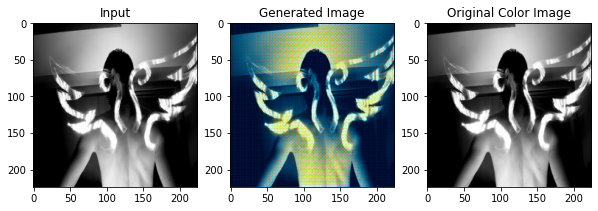

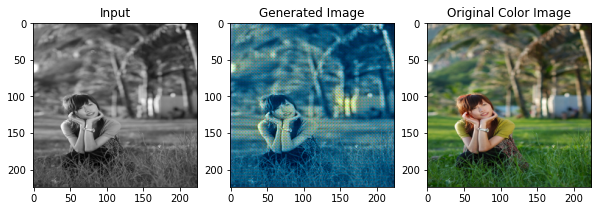

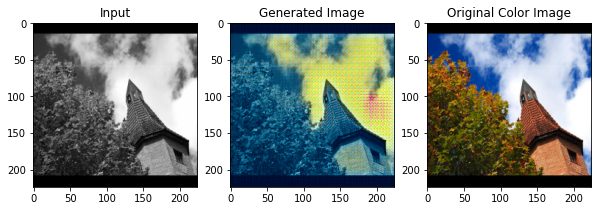

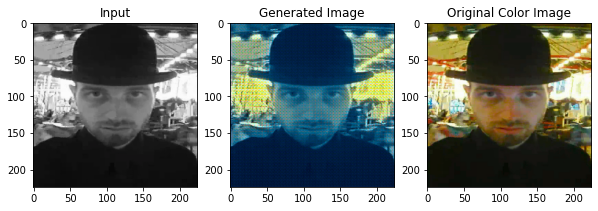

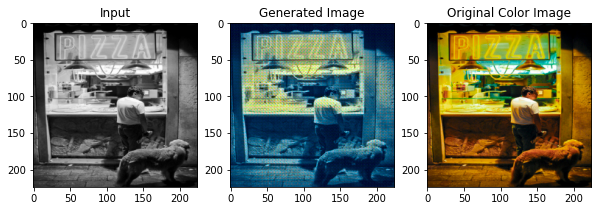

Epoch: 2 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 0.6275472640991211
Genereator Loss: 0.35200199484825134

Batch: 11/79
Discriminator Loss: 0.5673067569732666
Genereator Loss: 0.415629506111145

Batch: 21/79
Discriminator Loss: 0.4886845052242279
Genereator Loss: 0.27004197239875793

Batch: 31/79
Discriminator Loss: 0.4779682755470276
Genereator Loss: 0.26538509130477905

Batch: 41/79
Discriminator Loss: 0.4020547866821289
Genereator Loss: 0.2304202914237976

Batch: 51/79
Discriminator Loss: 0.8987623453140259
Genereator Loss: 0.7482490539550781

Batch: 61/79
Discriminator Loss: 0.5893253087997437
Genereator Loss: 0.6225262880325317

Batch: 71/79
Discriminator Loss: 0.4416762590408325
Genereator Loss: 0.503872811794281

Epoch: 2
Discriminator Loss: 0.5303766923614696
Generator Loss: 0.4336880749162239



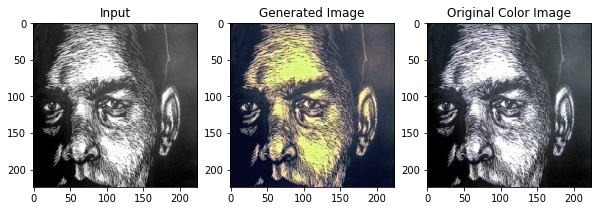

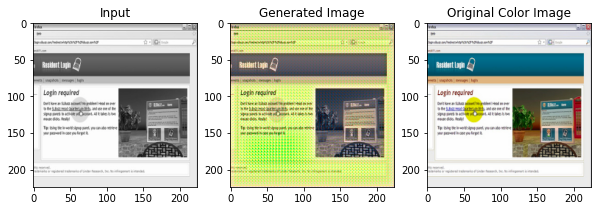

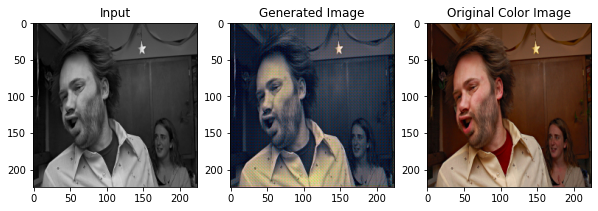

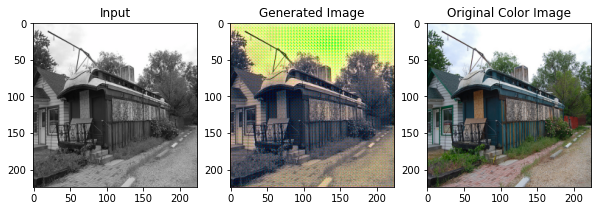

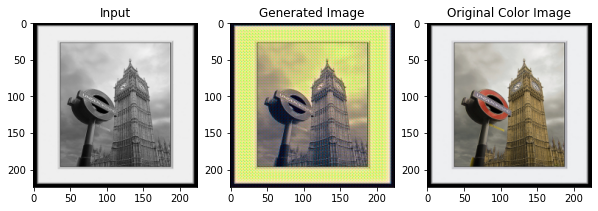

Epoch: 3 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 0.3698537349700928
Genereator Loss: 0.38855409622192383

Batch: 11/79
Discriminator Loss: 0.43509677052497864
Genereator Loss: 0.3073101341724396

Batch: 21/79
Discriminator Loss: 0.344169020652771
Genereator Loss: 0.208136186003685

Batch: 31/79
Discriminator Loss: 0.3143075108528137
Genereator Loss: 0.19950392842292786

Batch: 41/79
Discriminator Loss: 0.3393286466598511
Genereator Loss: 0.14418837428092957

Batch: 51/79
Discriminator Loss: 0.26979392766952515
Genereator Loss: 0.1815057247877121

Batch: 61/79
Discriminator Loss: 0.2676703929901123
Genereator Loss: 0.13680216670036316

Batch: 71/79
Discriminator Loss: 0.25321418046951294
Genereator Loss: 0.22651487588882446

Epoch: 3
Discriminator Loss: 0.31007242976110194
Generator Loss: 0.1974972116796276



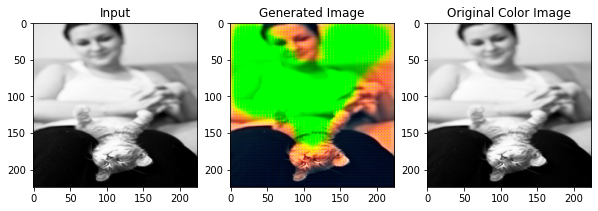

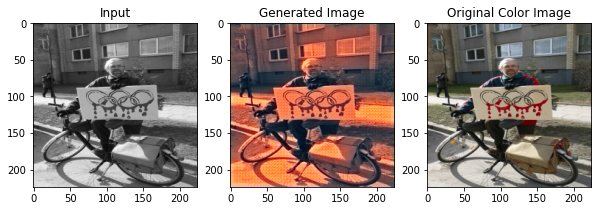

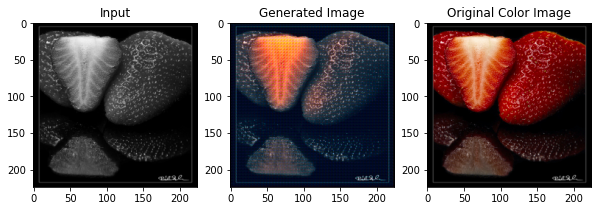

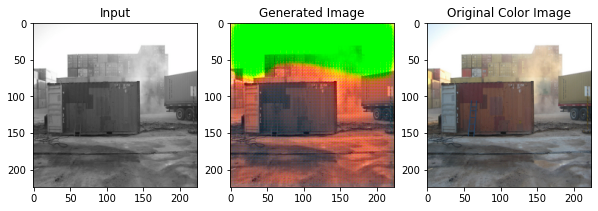

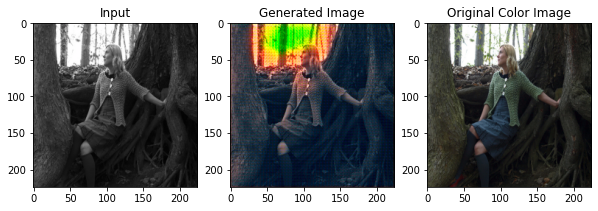

Epoch: 4 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 0.2469809353351593
Genereator Loss: 0.21092411875724792

Batch: 11/79
Discriminator Loss: 0.21522493660449982
Genereator Loss: 0.14462141692638397

Batch: 21/79
Discriminator Loss: 0.17014482617378235
Genereator Loss: 0.11331640183925629

Batch: 31/79
Discriminator Loss: 0.16978131234645844
Genereator Loss: 0.11587537825107574

Batch: 41/79
Discriminator Loss: 0.19418452680110931
Genereator Loss: 0.10016384720802307

Batch: 51/79
Discriminator Loss: 0.17564445734024048
Genereator Loss: 0.14490681886672974

Batch: 61/79
Discriminator Loss: 0.2811870276927948
Genereator Loss: 0.14706921577453613

Batch: 71/79
Discriminator Loss: 0.1890343725681305
Genereator Loss: 0.2121005803346634

Epoch: 4
Discriminator Loss: 0.20427904061124294
Generator Loss: 0.16652424161947227



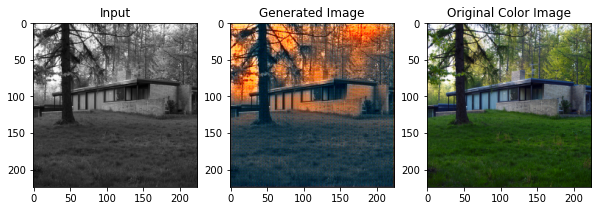

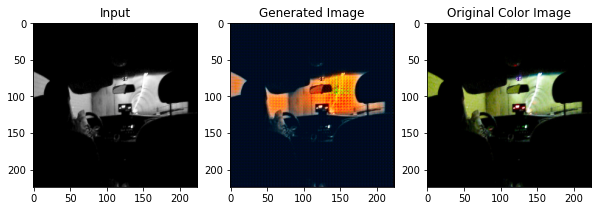

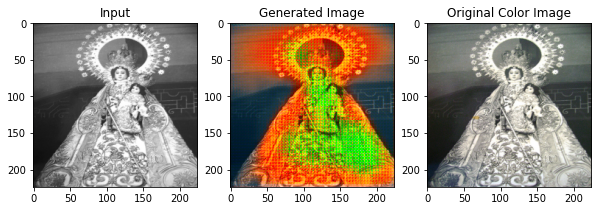

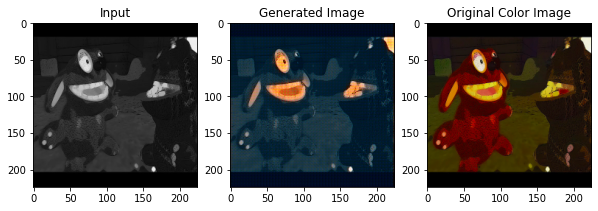

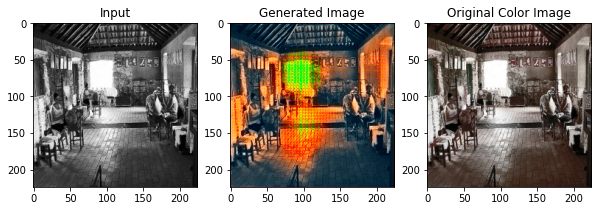

Epoch: 5 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 0.2117811143398285
Genereator Loss: 0.2914237976074219

Batch: 11/79
Discriminator Loss: 0.18382905423641205
Genereator Loss: 0.13251201808452606

Batch: 21/79
Discriminator Loss: 0.14039945602416992
Genereator Loss: 0.12199744582176208

Batch: 31/79
Discriminator Loss: 0.11124090850353241
Genereator Loss: 0.09141017496585846

Batch: 41/79
Discriminator Loss: 0.09494756907224655
Genereator Loss: 0.08787650614976883

Batch: 51/79
Discriminator Loss: 0.1424657255411148
Genereator Loss: 0.07615241408348083

Batch: 61/79
Discriminator Loss: 0.15294457972049713
Genereator Loss: 0.11129055172204971

Batch: 71/79
Discriminator Loss: 0.09078826010227203
Genereator Loss: 0.09348857402801514

Epoch: 5
Discriminator Loss: 0.1211150102788889
Generator Loss: 0.11913622463051277



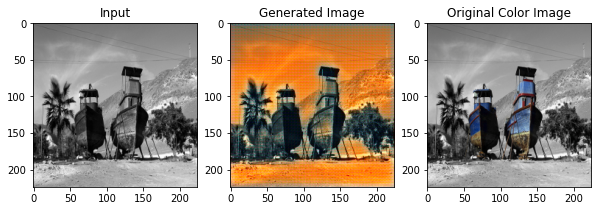

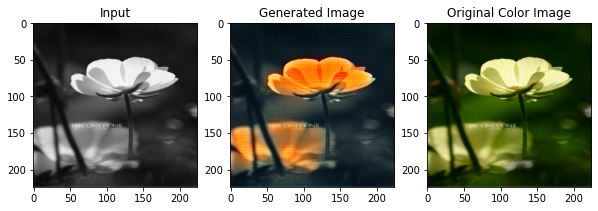

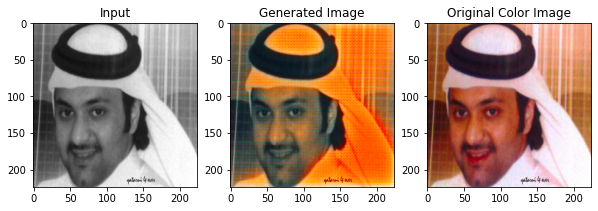

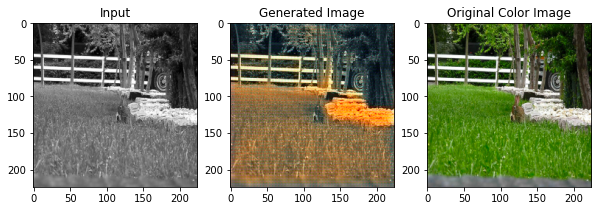

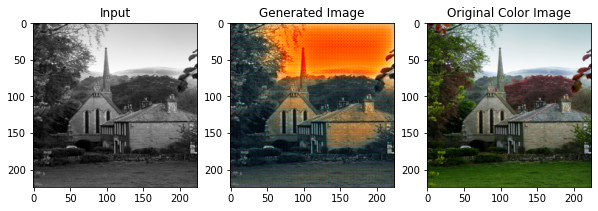

Epoch: 6 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 0.08742652088403702
Genereator Loss: 0.1221281886100769

Batch: 11/79
Discriminator Loss: 0.07552925497293472
Genereator Loss: 0.11548490822315216

Batch: 21/79
Discriminator Loss: 0.09624548256397247
Genereator Loss: 0.1036425530910492

Batch: 31/79
Discriminator Loss: 0.0710105150938034
Genereator Loss: 0.08618474006652832

Batch: 41/79
Discriminator Loss: 0.08243800699710846
Genereator Loss: 0.066391222178936

Batch: 51/79
Discriminator Loss: 0.06176017224788666
Genereator Loss: 0.07439930737018585

Batch: 61/79
Discriminator Loss: 0.05807697772979736
Genereator Loss: 0.06956648826599121

Batch: 71/79
Discriminator Loss: 0.060414474457502365
Genereator Loss: 0.06542214006185532

Epoch: 6
Discriminator Loss: 0.08009854157136966
Generator Loss: 0.08919084718144393



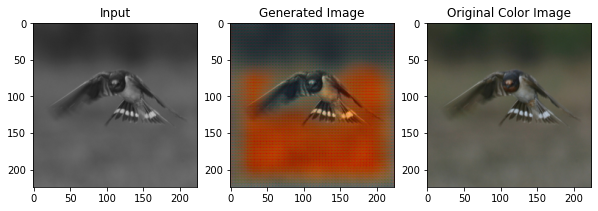

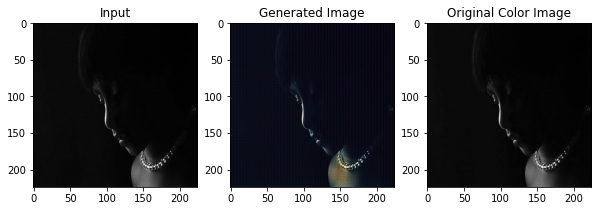

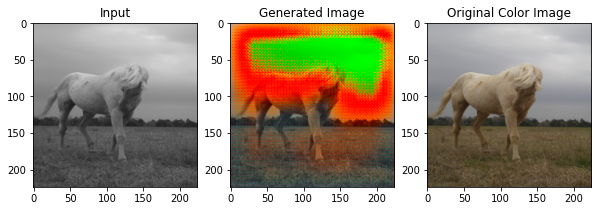

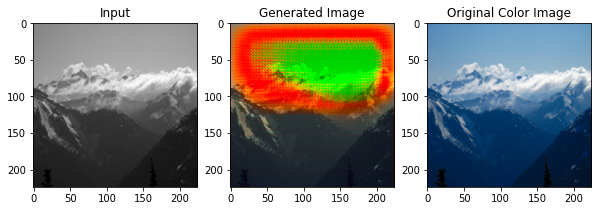

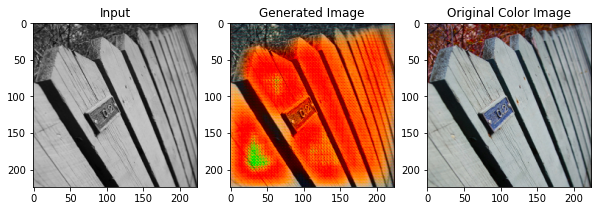

Epoch: 7 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 0.05985494703054428
Genereator Loss: 0.06888409703969955

Batch: 11/79
Discriminator Loss: 0.056852009147405624
Genereator Loss: 0.062204986810684204

Batch: 21/79
Discriminator Loss: 0.053703468292951584
Genereator Loss: 0.0944821834564209

Batch: 31/79
Discriminator Loss: 0.0556463748216629
Genereator Loss: 0.06338607519865036

Batch: 41/79
Discriminator Loss: 0.041562434285879135
Genereator Loss: 0.08572083711624146

Batch: 51/79
Discriminator Loss: 0.0567454919219017
Genereator Loss: 0.06256137788295746

Batch: 61/79
Discriminator Loss: 0.03890181705355644
Genereator Loss: 0.11085589230060577

Batch: 71/79
Discriminator Loss: 0.07480661571025848
Genereator Loss: 1.1426080465316772

Epoch: 7
Discriminator Loss: 0.07097421572366848
Generator Loss: 0.17982783008225356



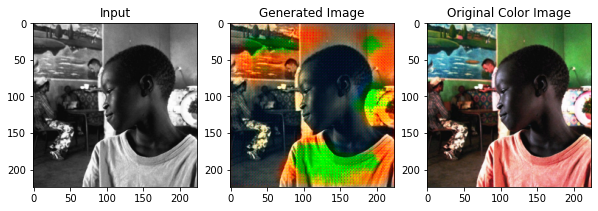

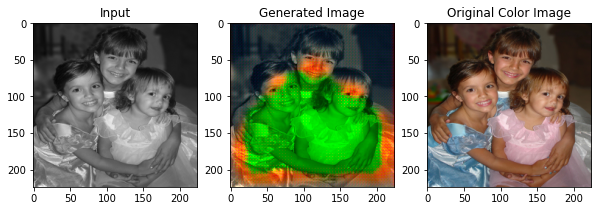

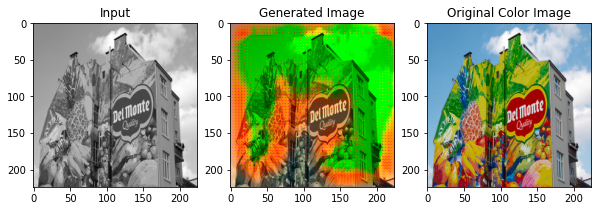

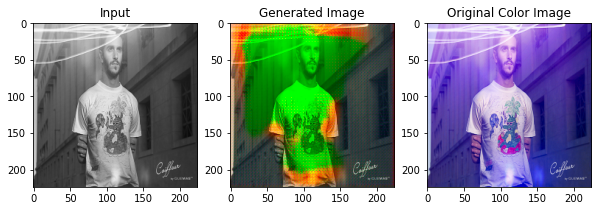

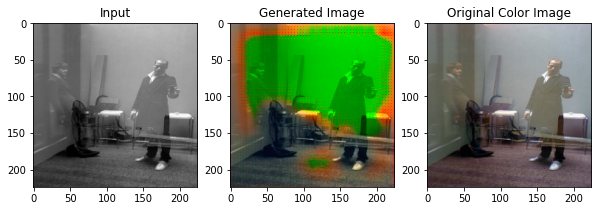

Epoch: 8 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 1.1948281526565552
Genereator Loss: 0.2540756165981293

Batch: 11/79
Discriminator Loss: 0.38562747836112976
Genereator Loss: 0.49374186992645264

Batch: 21/79
Discriminator Loss: 0.18856045603752136
Genereator Loss: 0.22040805220603943

Batch: 31/79
Discriminator Loss: 0.1216142326593399
Genereator Loss: 0.06916086375713348

Batch: 41/79
Discriminator Loss: 0.09129026532173157
Genereator Loss: 0.5247416496276855

Batch: 51/79
Discriminator Loss: 0.09382352977991104
Genereator Loss: 0.48727577924728394

Batch: 61/79
Discriminator Loss: 0.06941447407007217
Genereator Loss: 0.4222021698951721

Batch: 71/79
Discriminator Loss: 0.06474825739860535
Genereator Loss: 0.1609412282705307

Epoch: 8
Discriminator Loss: 0.18843731166252606
Generator Loss: 0.3715372762725323



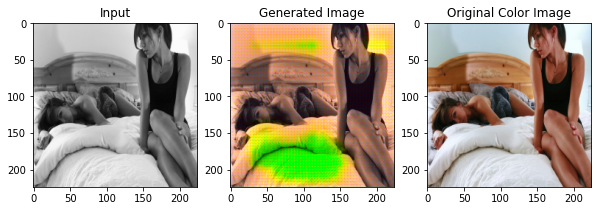

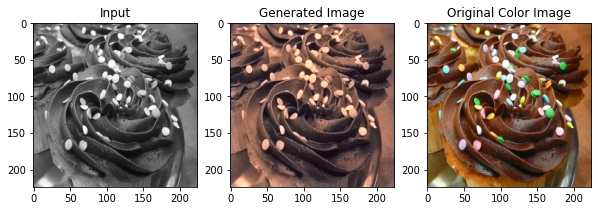

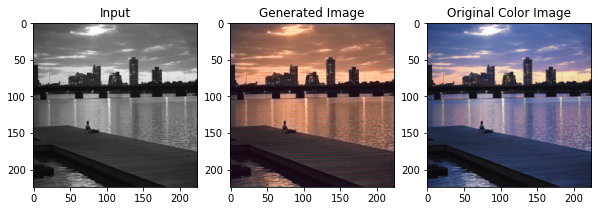

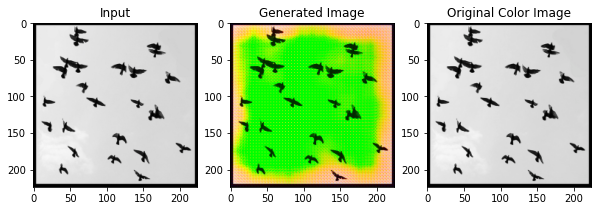

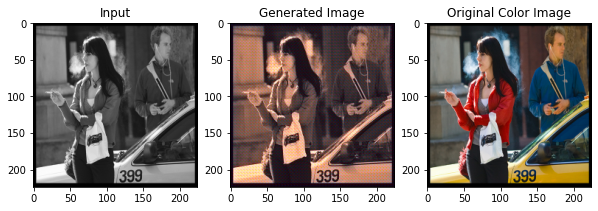

Epoch: 9 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 0.06046469509601593
Genereator Loss: 0.13668280839920044

Batch: 11/79
Discriminator Loss: 0.05753131955862045
Genereator Loss: 0.19184932112693787

Batch: 21/79
Discriminator Loss: 0.052154384553432465
Genereator Loss: 0.08206652104854584

Batch: 31/79
Discriminator Loss: 0.044549889862537384
Genereator Loss: 0.09691838175058365

Batch: 41/79
Discriminator Loss: 0.04355015978217125
Genereator Loss: 0.10352595150470734

Batch: 51/79
Discriminator Loss: 0.033416327089071274
Genereator Loss: 0.05858941376209259

Batch: 61/79
Discriminator Loss: 0.03600418567657471
Genereator Loss: 0.0612509548664093

Batch: 71/79
Discriminator Loss: 0.03637413680553436
Genereator Loss: 0.17119759321212769

Epoch: 9
Discriminator Loss: 0.046076712328233294
Generator Loss: 0.12822430231903173



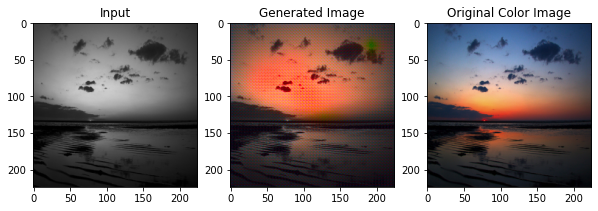

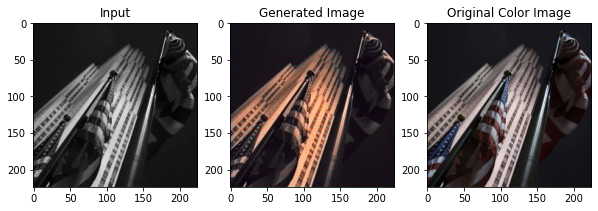

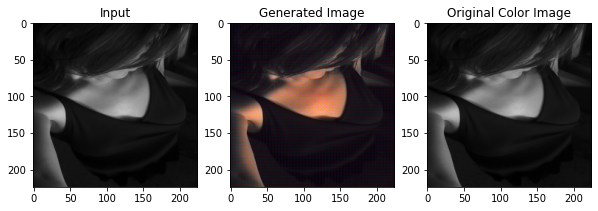

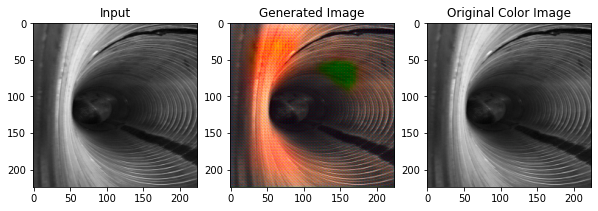

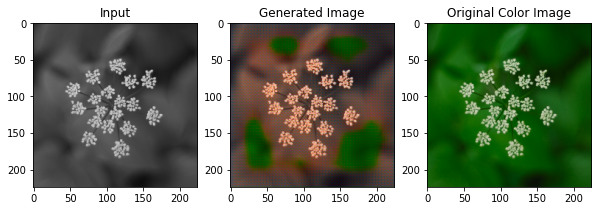

Epoch: 10 //////////////////////////////////////////////
Batch: 1/79
Discriminator Loss: 0.03250661492347717
Genereator Loss: 0.09126418828964233

Batch: 11/79
Discriminator Loss: 0.03797014057636261
Genereator Loss: 0.06715758144855499

Batch: 21/79
Discriminator Loss: 0.03283683955669403
Genereator Loss: 0.06534027308225632

Batch: 31/79
Discriminator Loss: 0.032874323427677155
Genereator Loss: 0.05840282142162323

Batch: 41/79
Discriminator Loss: 0.03211412951350212
Genereator Loss: 0.0673912838101387

Batch: 51/79
Discriminator Loss: 0.030232232064008713
Genereator Loss: 0.06402462720870972

Batch: 61/79
Discriminator Loss: 0.03161908686161041
Genereator Loss: 0.05452520027756691

Batch: 71/79
Discriminator Loss: 0.0310298353433609
Genereator Loss: 0.05744437873363495

Epoch: 10
Discriminator Loss: 0.03273542192351969
Generator Loss: 0.06561279683550701



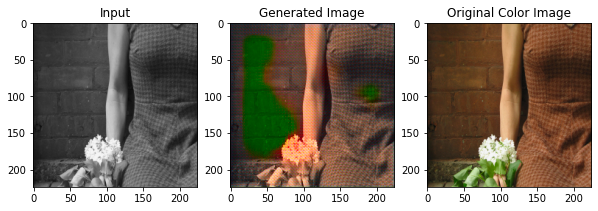

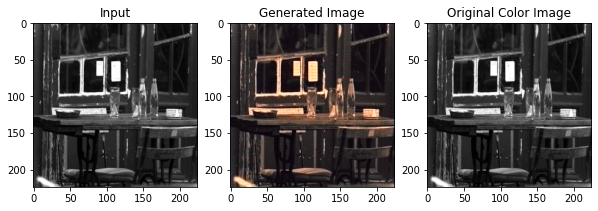

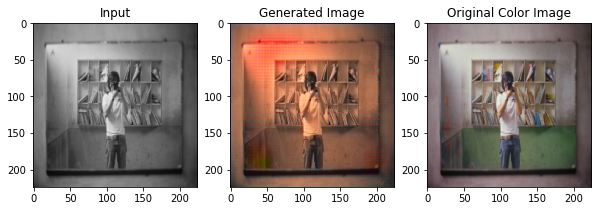

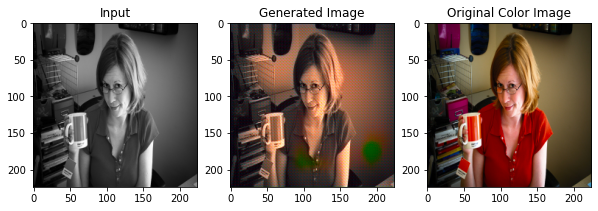

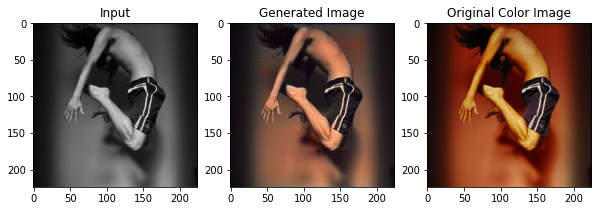

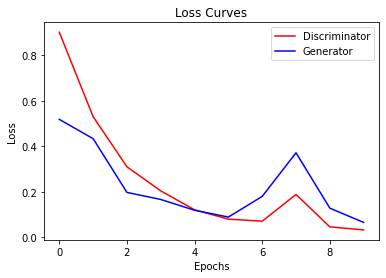

In [32]:
train_model(model, discrim_loss_func, gen_adversarial_loss_func, gen_recons_func, disc_opt, gen_opt, disc_sched, gen_sched, 10)

### Display Generated Images

In [23]:
def display_images(image_dataloader, num_images):

  for i, data in enumerate(image_dataloader):

    if i < num_images:
      plt.figure(figsize=(10,40))
      # unpacking/setting up data
      gray, color = data
      gray = gray.to(device)
      color = color.to(device)
      gray_image, color_image = gray[0], color[0]

      color_image = color_image.cpu().detach().numpy()
      gray_np = gray_image.cpu().detach().numpy()

      #making correct color image
      conc_color = np.concatenate((gray_np, color_image), axis=2)
      #conc_color = color.reshape(-1, 1, 1)
      color_image = generator_to_LAB(conc_color,1)

      #prep for generator
      gray_image = gray_image.unsqueeze(0).transpose(1,3)
      gray_image = gray_image.to(torch.float32)
      z = torch.randn(1, GEN_INPUT_SIZE, 1, 1).to(device)
      
      #get generated ab values
      gen_out = model.generator(z, gray_image)    # 1, 2, 224, 224
      gen_out = gen_out.transpose(1,3).squeeze()
      gen_out = gen_out.cpu().detach().numpy()
      # gen_out = gen_out.reshape(1, 224, 224, 2).squeeze()

      #make generated image
      conc_gen = np.concatenate((gray_np,gen_out), axis=2)
      gen_image = generator_to_LAB(conc_gen, 1)

      #make gray image
      gray_ab = np.zeros((224,224,2))
      gray_img = np.concatenate((gray_np*100, gray_ab), axis=2)    

      # convert to RGB
      gen_image = cv2.cvtColor(gen_image.astype('uint8'), cv2.COLOR_LAB2RGB)
      color_image = cv2.cvtColor(color_image.astype('uint8'), cv2.COLOR_LAB2RGB)
      gray_img = lab2rgb(gray_img)
      
      # Other Scenarios: 
      # gray_img = cv2.cvtColor(gray_img.astype('uint8'), cv2.COLOR_LAB2RGB)
      # gen_image = lab2rgb(gen_image)
      # color_image = lab2rgb(color_image)
      # gray_image = lab2rgb(gray_image)
      # gen_image = lab2rgb(conc_gen)
      # color_image = lab2rgb(conc_color)
      # gen_image = conc_gen
      # color_image = conc_color
      # color_image = color_image * 256
      # gen_image = gen_image * 256
      # gray_image = gray_image * 256
      # gen_image = lab2rgb(gen_image)
      # color_image = lab2rgb(color_image) 
      # gen_image = gen_image.astype('uint8')
      # color_image = color_image.astype('uint8')
      # imgan = imgan.astype('uint8')

      # Plot: 
      plt.subplot(num_images,3,3*i+1)
      plt.title('Input')                       
      plt.imshow(gray_img)

      plt.subplot(num_images,3,3*i+2)
      plt.title('Generated Image')
      plt.imshow(gen_image)

      plt.subplot(num_images,3,3*i+3)
      plt.title('Original Color Image')
      plt.imshow(color_image)

      plt.pause(0.05)


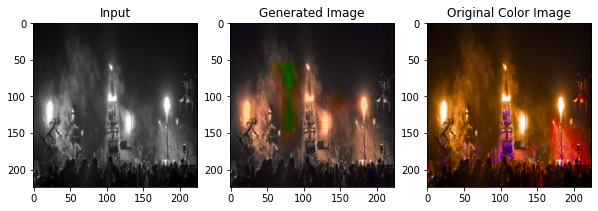

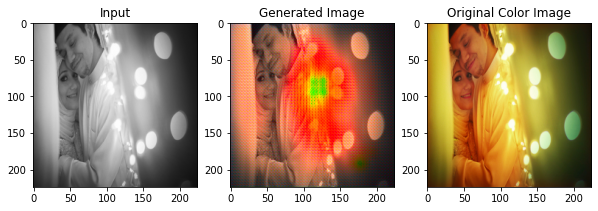

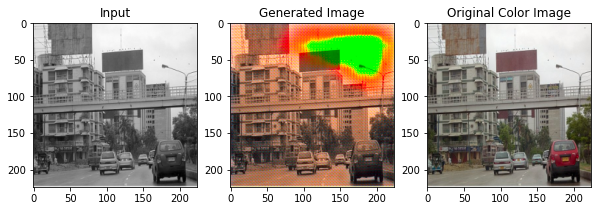

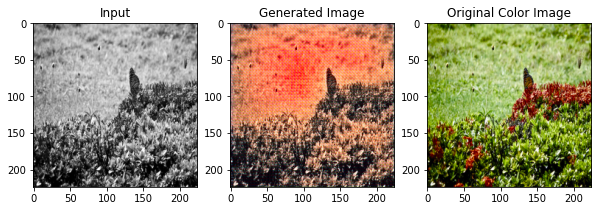

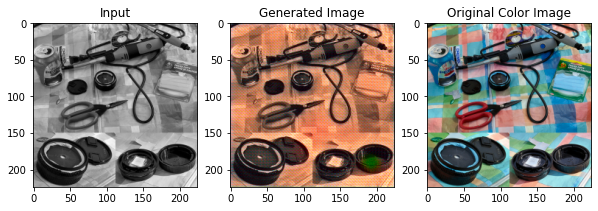

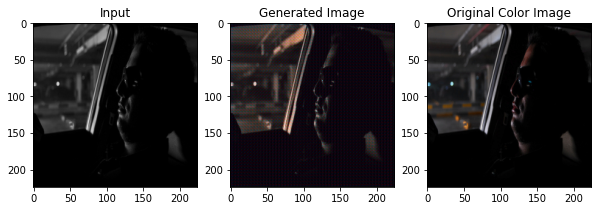

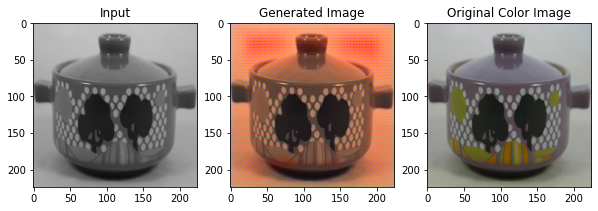

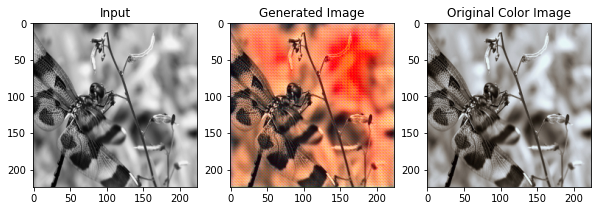

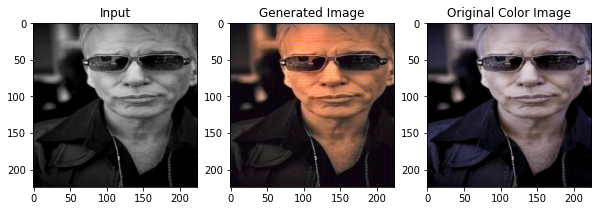

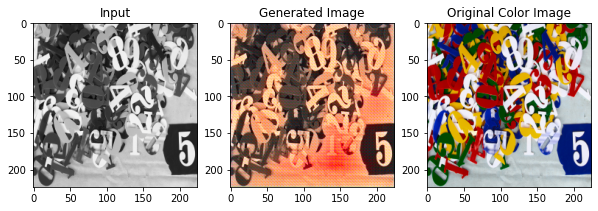

In [40]:
display_images(image_dataloader, 10)

In [ ]:
# PLotting

# if batch_idx == 5:
        #   print(ab.size())
        #   print(ab[0])
        #   z = ab[0].numpy()
        #   img = z.astype('uint8')
        #   img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
        #   plt.title('Color')
        #   plt.imshow(img)
        # # gray[0][0] ab[0][